In [1]:
import os
import json
import numpy as np
import cv2
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout

In [2]:
!git clone https://github.com/pedropro/TACO.git

Cloning into 'TACO'...
remote: Enumerating objects: 740, done.
remote: Total 740 (delta 0), reused 0 (delta 0), pack-reused 740 (from 1)
Receiving objects: 100% (740/740), 107.77 MiB | 33.22 MiB/s, done.
Resolving deltas: 100% (498/498), done.


In [3]:
%cd TACO
! python download.py
%cd ..

/content/TACO
Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished
/content


In [4]:
annotation_file='/content/TACO/data/annotations.json'
data_dir='/content/TACO/data'

In [5]:
def load_taco_annotations(annotation_file):
    """
    Load TACO dataset annotations from JSON.
    """
    with open(annotation_file, 'r') as f:
        data = json.load(f)
    return data

In [6]:
data = load_taco_annotations(annotation_file)

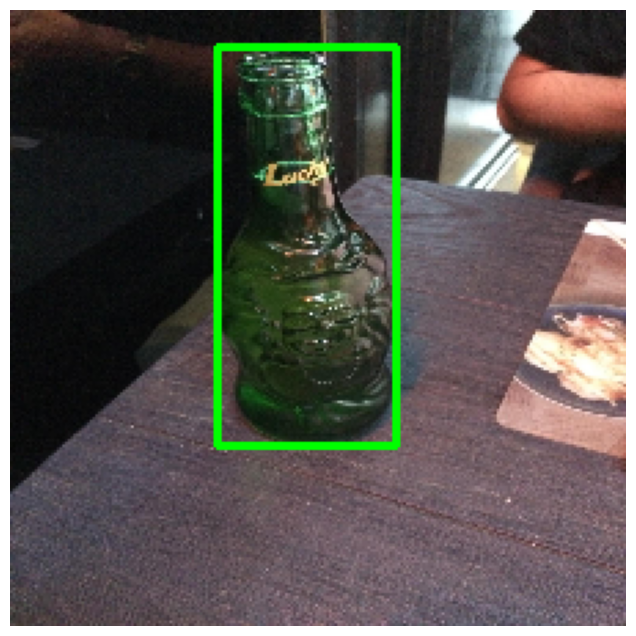

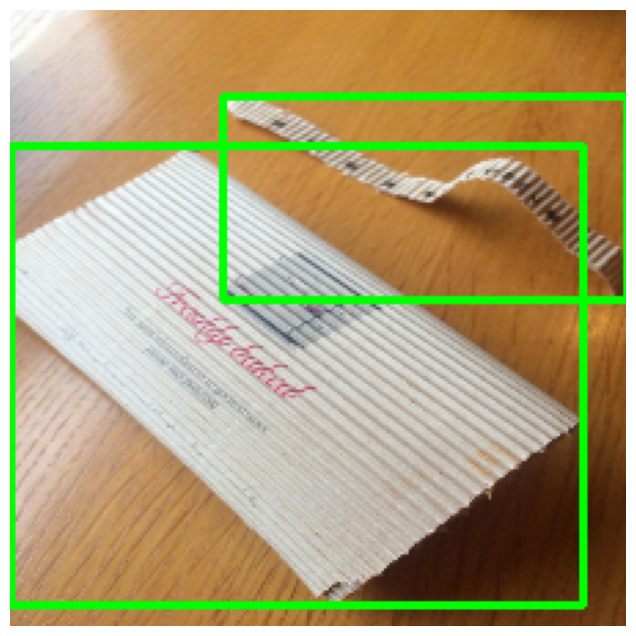

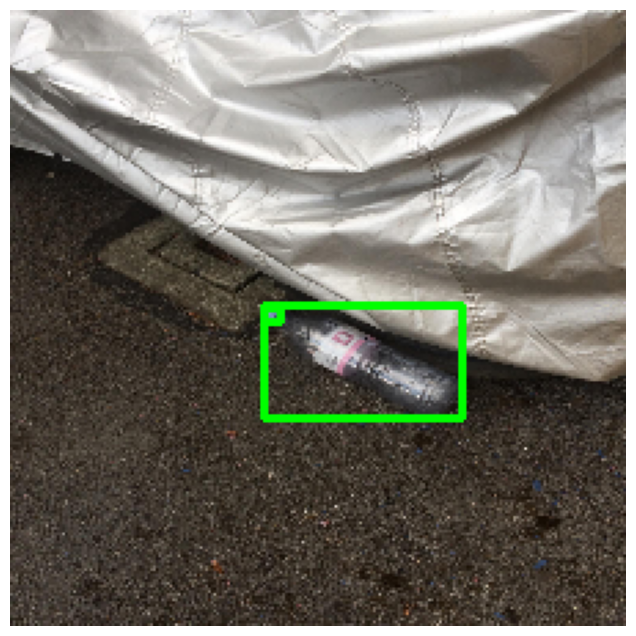

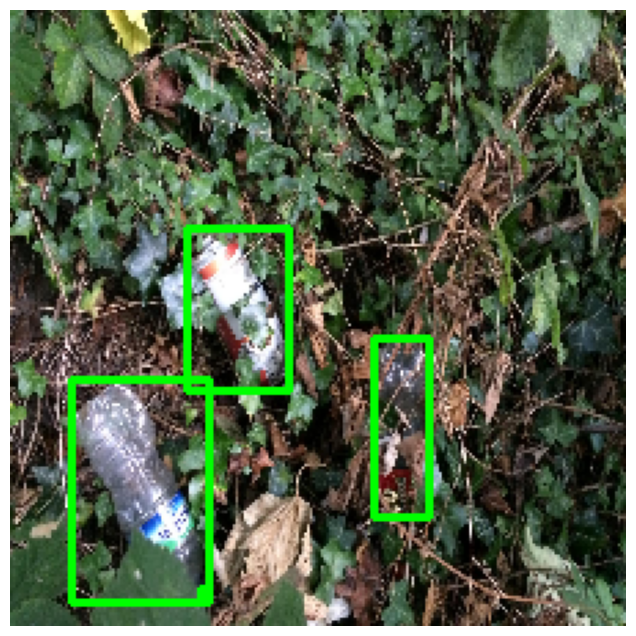

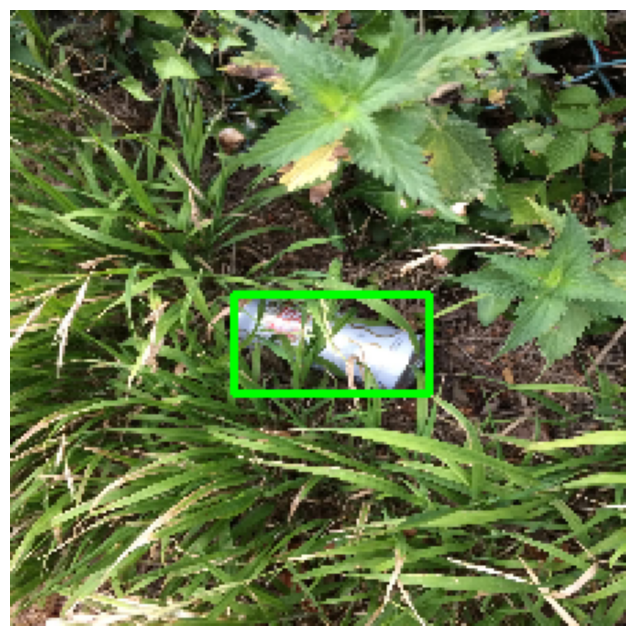

In [7]:
import cv2
import matplotlib.pyplot as plt
import os

def load_and_display_taco_data(annotation_file, data_dir, target_size=(224, 224)):
    """
    Load TACO dataset and display images with bounding boxes for all annotations of a given image.
    """
    # Load the annotations
    data = load_taco_annotations(annotation_file)

    # Dictionary to group annotations by image_id
    grouped_annotations = {}
    for ann in data['annotations']:
        image_id = ann['image_id']
        if image_id not in grouped_annotations:
            grouped_annotations[image_id] = []
        grouped_annotations[image_id].append(ann)

    # Iterate through each image and display all its bounding boxes
    for image_id, annotations in list(grouped_annotations.items())[:5]:  # Display first 5 images
        image_info = next(item for item in data['images'] if item['id'] == image_id)
        image_path = os.path.join(data_dir, image_info['file_name'])

        # Load the image
        image = cv2.imread(image_path)
        if image is None:
            continue

        # Resize the image
        h_orig, w_orig = image.shape[:2]
        image_resized = cv2.resize(image, target_size)
        h_resized, w_resized = target_size

        # Draw each bounding box on the resized image
        for ann in annotations:
            # Extract bounding box (format: [x_min, y_min, width, height])
            bbox = ann['bbox']
            x_min, y_min, width, height = bbox
            x_max = x_min + width
            y_max = y_min + height

            # Convert bounding box coordinates to resized image scale
            x_min = int((x_min / w_orig) * w_resized)
            y_min = int((y_min / h_orig) * h_resized)
            x_max = int((x_max / w_orig) * w_resized)
            y_max = int((y_max / h_orig) * h_resized)

            # Draw the bounding box
            image_resized = cv2.rectangle(image_resized, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

        # Display the image with all bounding boxes
        plt.figure(figsize=(8, 8))  # Optional: to make the images larger
        plt.imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
        plt.axis('off')  # Remove axis labels
        plt.show()

# Call the function to load and display images with bounding boxes
load_and_display_taco_data(annotation_file, data_dir)

## Load and Preprocessing annotation, and data Split  

In [8]:
def get_number_of_classes(data_dir, annotation_file):
    # Load annotations from the JSON file
    with open(os.path.join(data_dir, annotation_file), 'r') as f:
        annotations = json.load(f)

    # Extract all unique category IDs
    category_ids = set(ann['category_id'] for ann in annotations['annotations'])

    # Display the number of unique categories
    num_classes = len(category_ids)
    print(f"Number of classes in the TACO dataset: {num_classes}")

    return num_classes

# Usage
num_classes = get_number_of_classes(data_dir, annotation_file)


Number of classes in the TACO dataset: 59


In [9]:
def display_classes(data_dir, annotation_file):
    with open(os.path.join(data_dir, annotation_file), 'r') as f:
        annotations = json.load(f)

    # Extract category names and IDs
    category_map = {cat['id']: cat['name'] for cat in annotations['categories']}
    print("Classes in the TACO dataset:")
    for cat_id, cat_name in category_map.items():
        print(f"Class ID {cat_id}: {cat_name}")

# Usage
display_classes(data_dir, annotation_file)

Classes in the TACO dataset:
Class ID 0: Aluminium foil
Class ID 1: Battery
Class ID 2: Aluminium blister pack
Class ID 3: Carded blister pack
Class ID 4: Other plastic bottle
Class ID 5: Clear plastic bottle
Class ID 6: Glass bottle
Class ID 7: Plastic bottle cap
Class ID 8: Metal bottle cap
Class ID 9: Broken glass
Class ID 10: Food Can
Class ID 11: Aerosol
Class ID 12: Drink can
Class ID 13: Toilet tube
Class ID 14: Other carton
Class ID 15: Egg carton
Class ID 16: Drink carton
Class ID 17: Corrugated carton
Class ID 18: Meal carton
Class ID 19: Pizza box
Class ID 20: Paper cup
Class ID 21: Disposable plastic cup
Class ID 22: Foam cup
Class ID 23: Glass cup
Class ID 24: Other plastic cup
Class ID 25: Food waste
Class ID 26: Glass jar
Class ID 27: Plastic lid
Class ID 28: Metal lid
Class ID 29: Other plastic
Class ID 30: Magazine paper
Class ID 31: Tissues
Class ID 32: Wrapping paper
Class ID 33: Normal paper
Class ID 34: Paper bag
Class ID 35: Plastified paper bag
Class ID 36: Plast

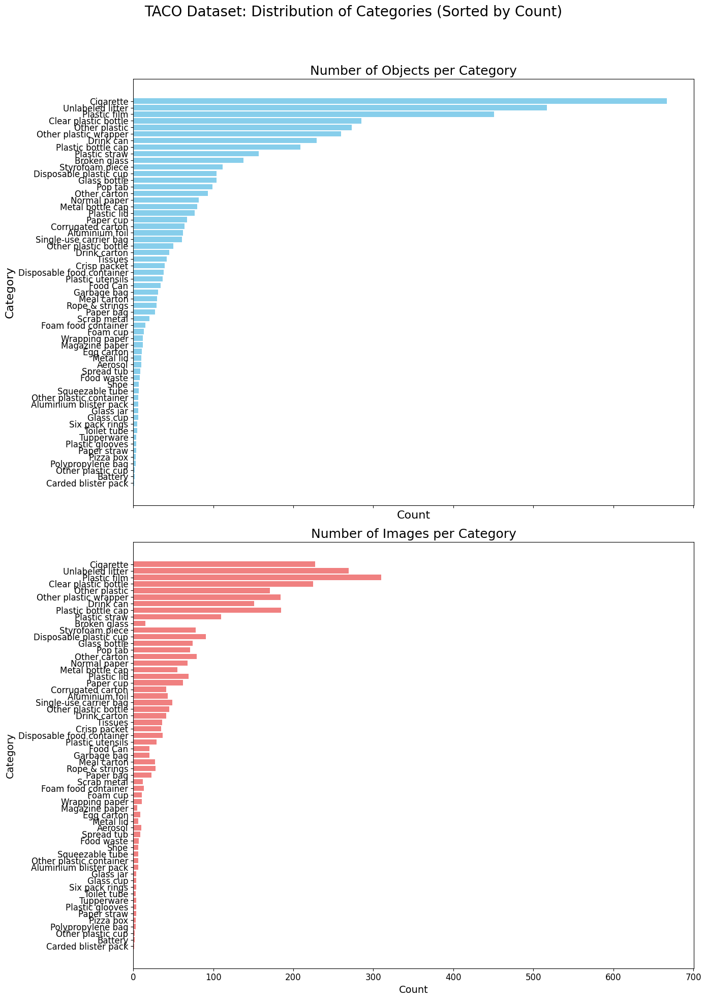

In [10]:
import json
import os
import matplotlib.pyplot as plt
from collections import defaultdict

def visualize_taco_categories(data_dir, annotation_file):
    # Load the annotations JSON file
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Extract category information
    categories = {cat['id']: cat['name'] for cat in annotations['categories']}

    # Initialize counters
    object_count = defaultdict(int)
    image_count = defaultdict(set)

    # Count objects and images for each category
    for ann in annotations['annotations']:
        category_id = ann['category_id']
        image_id = ann['image_id']

        # Count the number of objects per category
        object_count[category_id] += 1

        # Track unique images for each category
        image_count[category_id].add(image_id)

    # Convert image_count sets to counts
    image_count = {cat_id: len(images) for cat_id, images in image_count.items()}

    # Prepare data for plotting
    category_names = [categories[cat_id] for cat_id in object_count.keys()]
    num_objects = [object_count[cat_id] for cat_id in object_count.keys()]
    num_images = [image_count[cat_id] for cat_id in image_count.keys()]

    # Sort by the number of objects in ascending order
    sorted_indices = sorted(range(len(num_objects)), key=lambda i: num_objects[i])
    category_names_sorted = [category_names[i] for i in sorted_indices]
    num_objects_sorted = [num_objects[i] for i in sorted_indices]
    num_images_sorted = [num_images[i] for i in sorted_indices]

    # Plotting horizontal histograms with increased font size
    fig, axes = plt.subplots(2, 1, figsize=(14, 20), sharex=True)
    fig.suptitle("TACO Dataset: Distribution of Categories (Sorted by Count)", fontsize=20)

    # Plot object count per category
    axes[0].barh(category_names_sorted, num_objects_sorted, color='skyblue')
    axes[0].set_title("Number of Objects per Category", fontsize=18)
    axes[0].set_xlabel("Count", fontsize=16)
    axes[0].set_ylabel("Category", fontsize=16)
    axes[0].tick_params(axis='both', which='major', labelsize=12)

    # Plot image count per category
    axes[1].barh(category_names_sorted, num_images_sorted, color='lightcoral')
    axes[1].set_title("Number of Images per Category", fontsize=18)
    axes[1].set_xlabel("Count", fontsize=14)
    axes[1].set_ylabel("Category", fontsize=14)
    axes[1].tick_params(axis='both', which='major', labelsize=12)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Specify the directory where your TACO dataset is located
visualize_taco_categories(data_dir, annotation_file)


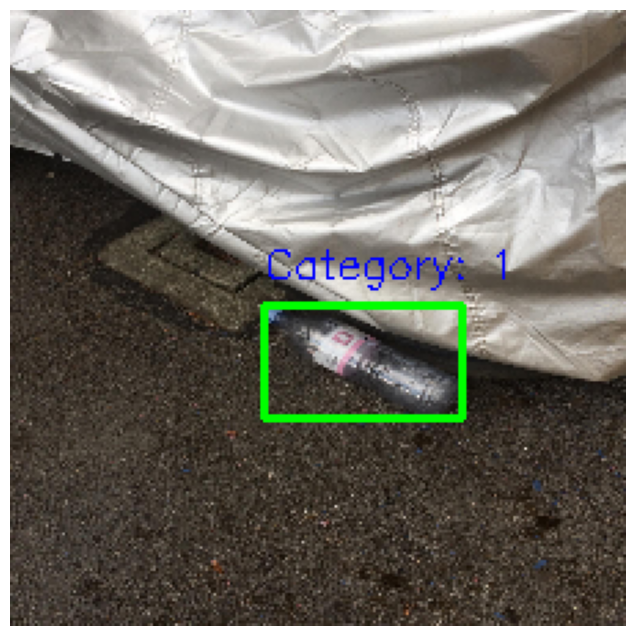

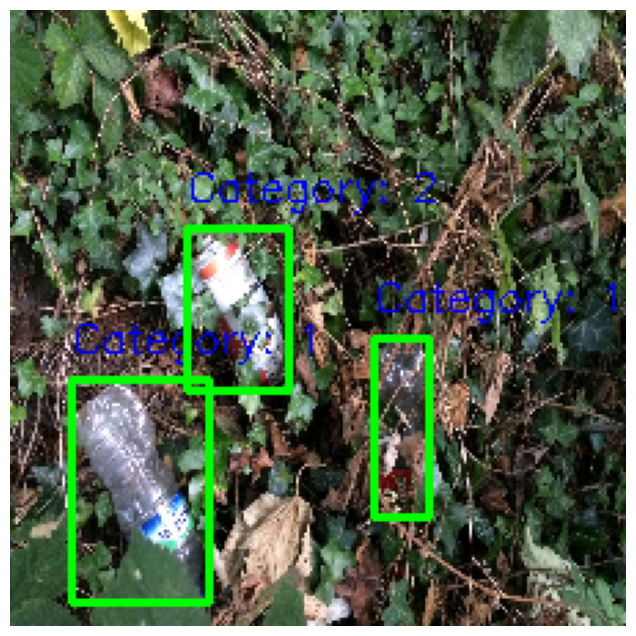

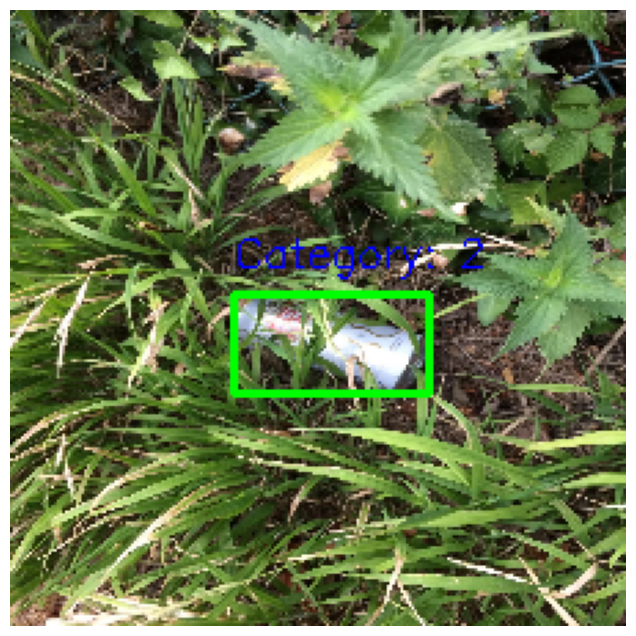

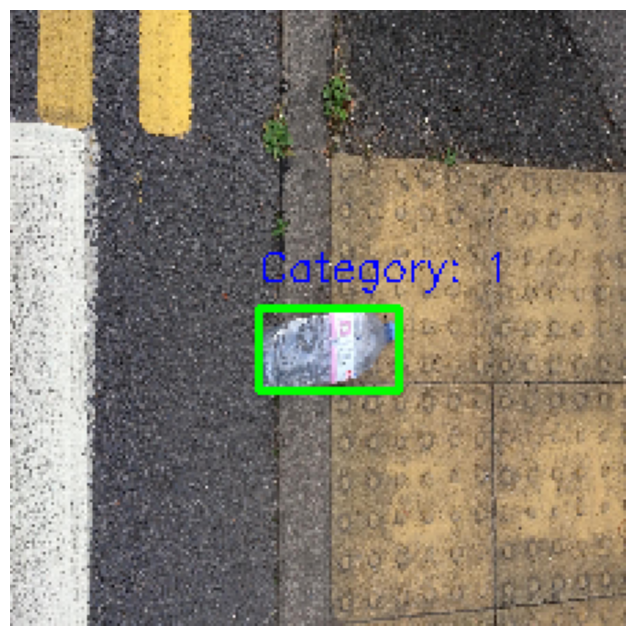

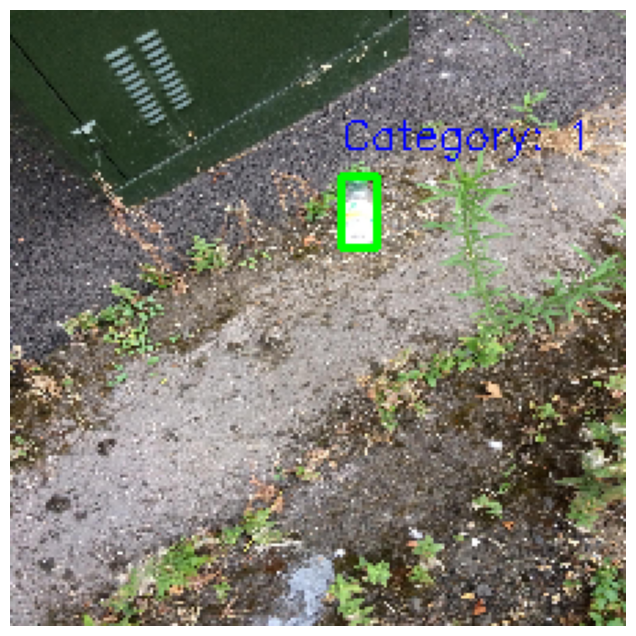

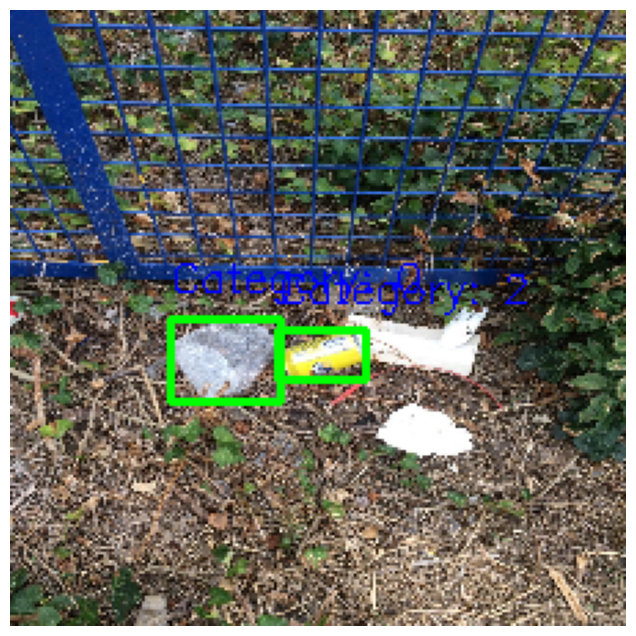

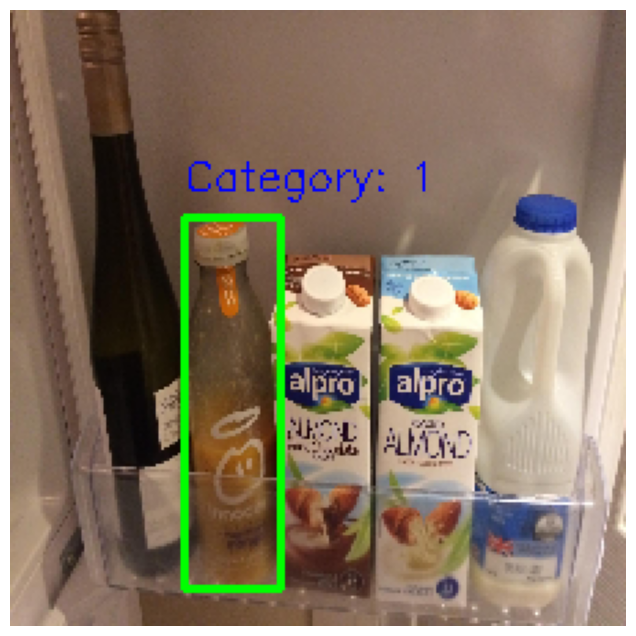

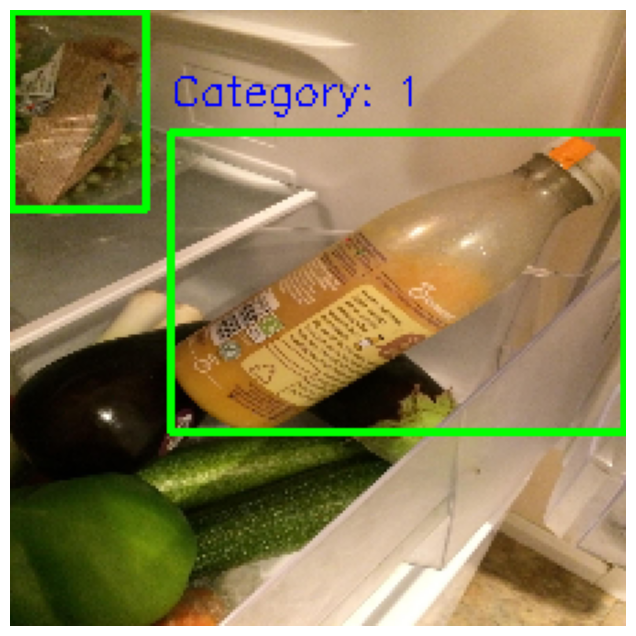

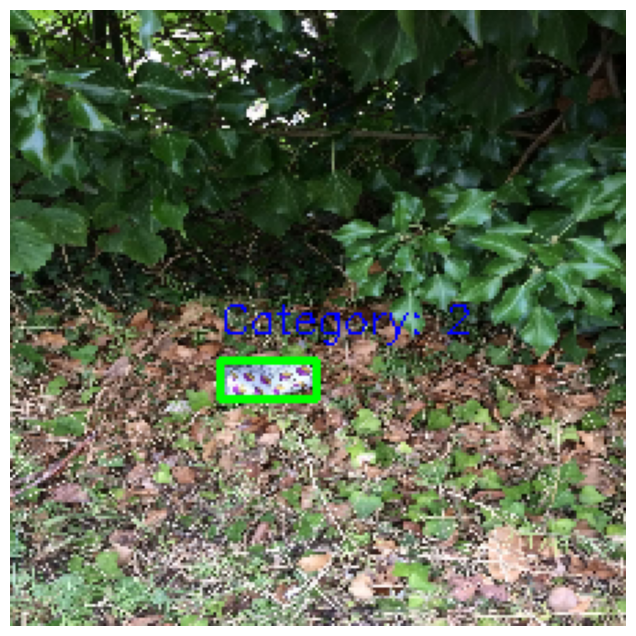

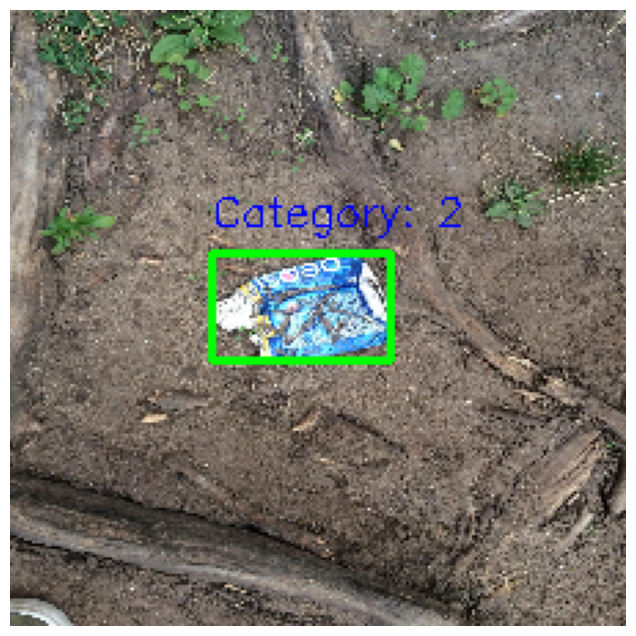

In [11]:
import cv2
import matplotlib.pyplot as plt
import os

def load_and_display_taco_data(annotation_file, data_dir, desired_categories, target_size=(224, 224)):
    """
    Load TACO dataset and display images with bounding boxes for specified categories.
    """
    # Load the annotations
    data = load_taco_annotations(annotation_file)

    # Dictionary to group annotations by image_id
    grouped_annotations = {}
    for ann in data['annotations']:
        # Only include annotations with categories in desired_categories
        if ann['category_id'] in desired_categories:
            image_id = ann['image_id']
            if image_id not in grouped_annotations:
                grouped_annotations[image_id] = []
            # Remap category_id using desired_categories dictionary
            ann['category_id'] = desired_categories[ann['category_id']]
            grouped_annotations[image_id].append(ann)

    # Iterate through each image and display all its bounding boxes
    for image_id, annotations in list(grouped_annotations.items())[:10]:  # Display first 10 images
        image_info = next(item for item in data['images'] if item['id'] == image_id)
        image_path = os.path.join(data_dir, image_info['file_name'])

        # Load the image
        image = cv2.imread(image_path)
        if image is None:
            continue

        # Resize the image
        h_orig, w_orig = image.shape[:2]
        image_resized = cv2.resize(image, target_size)
        h_resized, w_resized = target_size

        # Draw each bounding box on the resized image
        for ann in annotations:
            # Extract bounding box (format: [x_min, y_min, width, height])
            bbox = ann['bbox']
            x_min, y_min, width, height = bbox
            x_max = x_min + width
            y_max = y_min + height

            # Convert bounding box coordinates to resized image scale
            x_min = int((x_min / w_orig) * w_resized)
            y_min = int((y_min / h_orig) * h_resized)
            x_max = int((x_max / w_orig) * w_resized)
            y_max = int((y_max / h_orig) * h_resized)

            # Draw the bounding box
            image_resized = cv2.rectangle(image_resized, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            # Optionally display category label
            label = f"Category: {ann['category_id']}"
            cv2.putText(image_resized, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

        # Display the image with all bounding boxes
        plt.figure(figsize=(8, 8))  # Optional: to make the images larger
        plt.imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
        plt.axis('off')  # Remove axis labels
        plt.show()

# Desired categories dictionary (remapped IDs)
desired_categories = {
    36: 0,  # "Plastic film"
    5: 1,   # "Clear plastic bottle"
    12: 2,   # "Drink can"
    59: 3, # "Cigarette"
}

# Call the function to load and display images with bounding boxes for desired categories
load_and_display_taco_data(annotation_file, data_dir, desired_categories)


In [12]:
import json
import os
import numpy as np
from sklearn.model_selection import train_test_split
import cv2
from tqdm import tqdm

def load_and_preprocess_taco_data(data_dir, annotation_file='TACO/annotations.json', desired_categories=None, test_size=0.2, val_size=0.2, target_size=(224, 224)):
    """
    Load images, bounding boxes, and class labels from the TACO dataset,
    normalize bounding boxes and images, filter specific categories,
    and split the dataset into train, validation, and test sets.
    """
    images = []
    bboxes = []
    classes = []

    # Load annotations from JSON
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Process annotations and images
    for ann in tqdm(annotations['annotations']):
        # Filter based on desired categories
        if desired_categories and ann['category_id'] not in desired_categories:
            continue

        image_id = ann['image_id']
        image_info = next(item for item in annotations['images'] if item['id'] == image_id)
        image_path = os.path.join(data_dir, image_info['file_name'])

        # Load the image using OpenCV
        img = cv2.imread(image_path)
        if img is None:
            continue

        # Extract bounding box and remap class label
        bbox = ann['bbox']  # Format: [x_min, y_min, width, height]
        class_label = desired_categories[ann['category_id']] if desired_categories else ann['category_id']

        # Normalize bounding box coordinates
        h, w = img.shape[:2]
        bbox_normalized = [bbox[0] / w, bbox[1] / h, bbox[2] / w, bbox[3] / h]

        # Resize and normalize the image
        img_resized = cv2.resize(img, target_size)
        img_normalized = img_resized / 255.0

        # Store images, bounding boxes, and class labels
        images.append(img_normalized)
        bboxes.append(bbox_normalized)
        classes.append(class_label)

    images = np.array(images)
    bboxes = np.array(bboxes)
    classes = np.array(classes)

    # Split into train, validation, and test sets
    X_train, X_temp, y_train_bboxes, y_temp_bboxes, y_train_classes, y_temp_classes = train_test_split(
        images, bboxes, classes, test_size=test_size + val_size, random_state=42)

    val_size_adjusted = val_size / (val_size + test_size)  # Adjust validation split within the remaining data
    X_val, X_test, y_val_bboxes, y_test_bboxes, y_val_classes, y_test_classes = train_test_split(
        X_temp, y_temp_bboxes, y_temp_classes, test_size=val_size_adjusted, random_state=42)

    return (X_train, y_train_bboxes, y_train_classes), (X_val, y_val_bboxes, y_val_classes), (X_test, y_test_bboxes, y_test_classes)

# Usage example with desired categories
desired_categories = {
    36: 0,  # "Plastic film"
    5: 1,   # "Clear plastic bottle"
    12: 2,   # "Drink can"
    59: 3, # "Cigarette
}
(train_images, train_bboxes, train_classes), (val_images, val_bboxes, val_classes), (test_images, test_bboxes, test_classes) = load_and_preprocess_taco_data(data_dir, annotation_file, desired_categories)


100%|██████████| 4784/4784 [01:41<00:00, 47.05it/s]


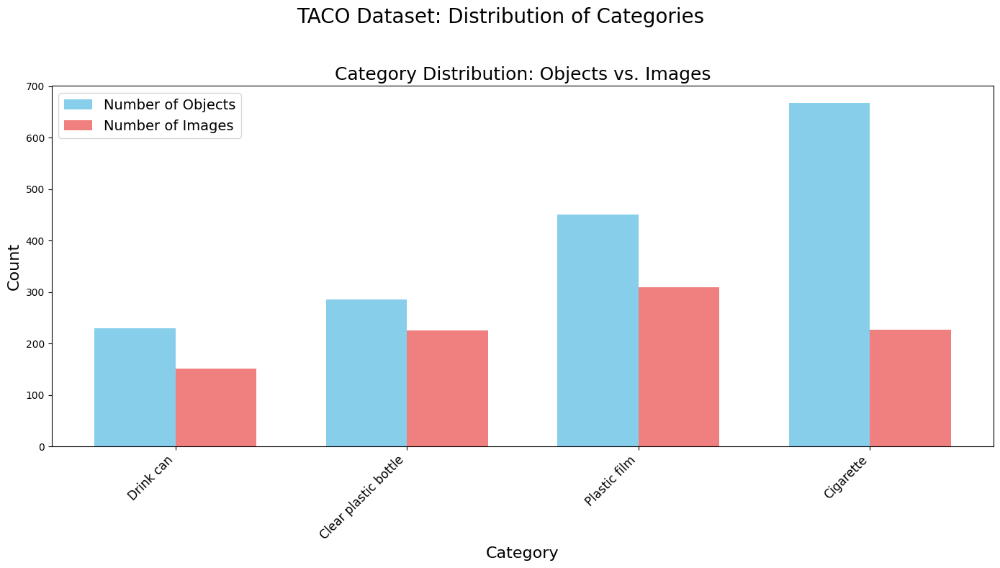

In [13]:
def visualize_taco_categories(data_dir, annotation_file, desired_categories=None):
    """
    Visualize the distribution of categories in the TACO dataset as a side-by-side
    bar chart for object counts and image counts per category.

    Parameters:
    - data_dir (str): Directory where the dataset is located.
    - annotation_file (str): Path to the annotations JSON file.
    - desired_categories (dict, optional): A mapping from category IDs to desired class labels.
    """

    # Load the annotations JSON file
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Extract category information
    categories = {cat['id']: cat['name'] for cat in annotations['categories']}

    # If desired_categories is provided, filter the annotations
    if desired_categories:
        valid_category_ids = set(desired_categories.keys())
        categories = {cat_id: categories[cat_id] for cat_id in valid_category_ids}
    else:
        valid_category_ids = set(categories.keys())

    # Initialize counters
    object_count = defaultdict(int)
    image_count = defaultdict(set)

    # Count objects and images for each category
    for ann in annotations['annotations']:
        category_id = ann['category_id']
        image_id = ann['image_id']

        if category_id in valid_category_ids:
            # Count the number of objects per category
            object_count[category_id] += 1

            # Track unique images for each category
            image_count[category_id].add(image_id)

    # Convert image_count sets to counts
    image_count = {cat_id: len(images) for cat_id, images in image_count.items()}

    # Prepare data for plotting
    category_names = [categories[cat_id] for cat_id in object_count.keys()]
    num_objects = [object_count[cat_id] for cat_id in object_count.keys()]
    num_images = [image_count[cat_id] for cat_id in image_count.keys()]

    # Sort by the number of objects in ascending order
    sorted_indices = sorted(range(len(num_objects)), key=lambda i: num_objects[i])
    category_names_sorted = [category_names[i] for i in sorted_indices]
    num_objects_sorted = [num_objects[i] for i in sorted_indices]
    num_images_sorted = [num_images[i] for i in sorted_indices]

    # Plotting side-by-side bar chart
    x = range(len(category_names_sorted))  # x positions for categories

    width = 0.35  # Width of each bar

    fig, ax = plt.subplots(figsize=(14, 8))
    fig.suptitle("TACO Dataset: Distribution of Categories", fontsize=20)

    # Object count bars
    ax.bar(
        [pos - width/2 for pos in x], num_objects_sorted, width, label="Number of Objects", color='skyblue'
    )
    # Image count bars
    ax.bar(
        [pos + width/2 for pos in x], num_images_sorted, width, label="Number of Images", color='lightcoral'
    )

    # Set labels and titles
    ax.set_title("Category Distribution: Objects vs. Images", fontsize=18)
    ax.set_xlabel("Category", fontsize=16)
    ax.set_ylabel("Count", fontsize=16)
    ax.set_xticks(x)
    ax.set_xticklabels(category_names_sorted, rotation=45, ha="right", fontsize=12)
    ax.legend(fontsize=14)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Example usage
desired_categories = {
    36: 0,  # "Plastic film"
    5: 1,   # "Clear plastic bottle"
    12: 2,   # "Drink can"
    59: 3, # "Cigarette
}

data_dir = "TACO/data"  # Replace with the actual path to your TACO dataset
annotation_file = 'annotations.json'  # Adjust this if necessary

visualize_taco_categories(data_dir, annotation_file, desired_categories=desired_categories)


In [14]:
print(f"Train Images: {train_images.shape}, Train BBoxes: {train_bboxes.shape}, Train Classes: {train_classes.shape}")
print(f"Val Images: {val_images.shape}, Val BBoxes: {val_bboxes.shape}, Val Classes: {val_classes.shape}")
print(f"Test Images: {test_images.shape}, Test BBoxes: {test_bboxes.shape}, Test Classes: {test_classes.shape}")

Train Images: (979, 224, 224, 3), Train BBoxes: (979, 4), Train Classes: (979,)
Val Images: (326, 224, 224, 3), Val BBoxes: (326, 4), Val Classes: (326,)
Test Images: (327, 224, 224, 3), Test BBoxes: (327, 4), Test Classes: (327,)


## Implementation of a CNN for Object Detection

In [16]:
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

def build_object_detection_model(input_shape=(224, 224, 3), num_classes=4):
    input_layer = Input(shape=input_shape)

    # Convolutional layers
    x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(input_layer)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Flatten()(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.5)(x)

    # Bounding box output (4 values)
    bbox_output = layers.Dense(4, activation='sigmoid')(x)

    # Class output (classification)
    class_output = layers.Dense(num_classes, activation='softmax')(x)

    # Concatenate the outputs
    output = layers.Concatenate()([bbox_output, class_output])

    model = Model(inputs=input_layer, outputs=output)
    return model


## Custom Loss fct implementation



In [22]:
from tensorflow.keras.losses import SparseCategoricalCrossentropy
def custom_loss(y_true, y_pred):
    # Extract ground truth bounding boxes and class labels
    bbox_true = y_true[:, :4]
    class_true = tf.cast(y_true[:, 4], tf.int32)

    # Extract predictions
    bbox_pred = y_pred[:, :4]
    class_pred = y_pred[:, 4:]

    # Debug prints to see the input/output values
    print(f"bbox_true: {bbox_true[:5]}")
    print(f"class_true: {class_true[:5]}")
    print(f"bbox_pred: {bbox_pred[:5]}")
    print(f"class_pred: {class_pred[:5]}")

       # Compute bounding box loss using Smooth L1 loss (Huber loss)
    bbox_loss = tf.reduce_mean(tf.losses.huber(bbox_true, bbox_pred))

    # Compute classification loss (Sparse Categorical Crossentropy)
    class_loss_fn = SparseCategoricalCrossentropy()
    class_loss = tf.reduce_mean(class_loss_fn(class_true, class_pred))

    # Combine the two losses
    total_loss = bbox_loss + class_loss
    print(f"Bbox Loss: {bbox_loss.numpy()}, Class Loss: {class_loss.numpy()}, Total Loss: {total_loss.numpy()}")

    return total_loss

tf.config.run_functions_eagerly(True)



## Functions for evaluation after aech epoch

In [23]:
import numpy as np
import pandas as pd
from tensorflow.keras.callbacks import Callback

# IoU calculation
def compute_iou(bbox1, bbox2):
    x1, y1, w1, h1 = bbox1
    x2, y2, w2, h2 = bbox2

    # Calculate the intersection coordinates
    x_inter = max(x1, x2)
    y_inter = max(y1, y2)
    w_inter = min(x1 + w1, x2 + w2) - x_inter
    h_inter = min(y1 + h1, y2 + h2) - y_inter

    # No intersection
    if w_inter <= 0 or h_inter <= 0:
        return 0.0

    # Calculate areas
    intersection_area = w_inter * h_inter
    bbox1_area = w1 * h1
    bbox2_area = w2 * h2
    union_area = bbox1_area + bbox2_area - intersection_area

    return intersection_area / union_area

# Compute Average Precision (AP)
def compute_ap(pred_bboxes, true_bboxes, pred_classes, true_classes, iou_threshold=0.5):
    tp = 0
    fp = 0
    fn = 0

    for i in range(len(pred_bboxes)):
        max_iou = 0
        best_match_idx = -1
        for j in range(len(true_bboxes)):
            iou = compute_iou(pred_bboxes[i], true_bboxes[j])
            if iou > max_iou:
                max_iou = iou
                best_match_idx = j

        if max_iou >= iou_threshold and pred_classes[i] == true_classes[best_match_idx]:
            tp += 1
        else:
            fp += 1
            fn += 1

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    ap = tp / (tp + fp) if (tp + fp) > 0 else 0

    return ap, precision, recall

# Compute mean Average Precision (mAP) at multiple IoU thresholds
def compute_map_at_multiple_iou(pred_bboxes, true_bboxes, pred_classes, true_classes, iou_thresholds=[0.5, 0.75, 0.9]):
    aps = []
    for iou_threshold in iou_thresholds:
        ap, precision, recall = compute_ap(pred_bboxes, true_bboxes, pred_classes, true_classes, iou_threshold)
        aps.append(ap)
        print(f"IoU Threshold: {iou_threshold:.2f} | AP: {ap:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}")

    map_value = np.mean(aps)
    return map_value

# Custom callback for evaluation
class EvaluationCallback(Callback):
    def __init__(self, val_images, val_bboxes, val_classes, iou_threshold=0.5):
        super().__init__()
        self.val_images = val_images
        self.val_bboxes = val_bboxes
        self.val_classes = val_classes
        self.iou_threshold = iou_threshold
        self.epoch_metrics = []  # Store metrics for summary at the end

    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            logs = {}

        # Predict bounding boxes and class labels for the validation set
        predictions = self.model.predict(self.val_images)

        # Extract predicted bounding boxes and class labels from model output
        pred_bboxes = predictions[:, :4]  # First 4 columns are bounding box predictions
        pred_classes = np.argmax(predictions[:, 4:], axis=-1)  # Remaining columns are class scores

        # Compute overall metrics (precision, recall, mAP@50)
        ap_50, precision, recall = compute_ap(
            pred_bboxes, self.val_bboxes,
            pred_classes, self.val_classes,
            iou_threshold=self.iou_threshold
        )

        # Calculate mAP@50-95
        map_50_95 = compute_map_at_multiple_iou(
            pred_bboxes, self.val_bboxes,
            pred_classes, self.val_classes
        )

        # Print metrics for the current epoch
        print(f"Epoch {epoch + 1}: Precision: {precision:.4f}, Recall: {recall:.4f}, mAP@50: {ap_50:.4f}, mAP@50-95: {map_50_95:.4f}")

        # Store metrics for later detailed summary
        self.epoch_metrics.append({
            'Precision': precision,
            'Recall': recall,
            'mAP@50': ap_50,
            'mAP@50-95': map_50_95
        })

        # Optionally store in logs for TensorBoard or other systems
        logs['precision'] = precision
        logs['recall'] = recall
        logs['mAP@50'] = ap_50
        logs['mAP@50-95'] = map_50_95

    def on_train_end(self, logs=None):
        # Generate category-wise summary after training
        print("\nTraining Complete. Generating Category-wise Summary...\n")
        self.category_summary()

    def category_summary(self):
        """ Display a summary of metrics per category in a table format. """
        # Predict bounding boxes and class labels for the validation set
        predictions = self.model.predict(self.val_images)
        pred_bboxes = predictions[:, :4]  # First 4 columns are bounding box predictions
        pred_classes = np.argmax(predictions[:, 4:], axis=-1)  # Remaining columns are class scores

        categories = np.unique(self.val_classes)
        summary_data = []

        for category in categories:
            # Filter predictions and ground truth by category
            category_mask = (self.val_classes.flatten() == category)
            cat_pred_bboxes = pred_bboxes[category_mask]
            cat_true_bboxes = self.val_bboxes[category_mask]
            cat_pred_classes = pred_classes[category_mask]
            cat_true_classes = self.val_classes[category_mask]

            # Compute metrics for the current category
            ap_50, precision, recall = compute_ap(
                cat_pred_bboxes, cat_true_bboxes,
                cat_pred_classes, cat_true_classes,
                iou_threshold=self.iou_threshold
            )

            map_50_95 = compute_map_at_multiple_iou(
                cat_pred_bboxes, cat_true_bboxes,
                cat_pred_classes, cat_true_classes
            )

            summary_data.append({
                'Category': category,
                'Precision': precision,
                'Recall': recall,
                'mAP@50': ap_50,
                'mAP@50-95': map_50_95
            })

        # Create a DataFrame for better formatting
        summary_df = pd.DataFrame(summary_data)
        print(summary_df)
        print("\n")


In [ ]:
# from tensorflow.keras.callbacks import Callback

# class EvaluationCallback(Callback):
#     def __init__(self, val_images, val_bboxes, val_classes, iou_threshold=0.5):
#         super().__init__()
#         self.val_images = val_images
#         self.val_bboxes = val_bboxes
#         self.val_classes = val_classes
#         self.iou_threshold = iou_threshold
#         self.epoch_metrics = []  # Store metrics for summary at the end

#     def on_epoch_end(self, epoch, logs=None):
#         if logs is None:
#             logs = {}

#         # Predict bounding boxes and class labels for the validation set
#         predictions = self.model.predict(self.val_images)

#         # Extract predicted bounding boxes and class labels from model output
#         pred_bboxes = predictions[:, :4]  # First 4 columns are bounding box predictions
#         pred_classes = np.argmax(predictions[:, 4:], axis=-1)  # Remaining columns are class scores

#         # Compute overall metrics (precision, recall, mAP@50)
#         ap_50, precision, recall = compute_ap(
#             pred_bboxes, self.val_bboxes,
#             pred_classes, self.val_classes,
#             iou_threshold=self.iou_threshold
#         )

#         # Calculate mAP@50-95
#         map_50_95 = compute_map_at_multiple_iou(
#             pred_bboxes, self.val_bboxes,
#             pred_classes, self.val_classes
#         )

#         # Print metrics for the current epoch
#         print(f"Epoch {epoch + 1}: Precision: {precision:.4f}, Recall: {recall:.4f}, mAP@50: {ap_50:.4f}, mAP@50-95: {map_50_95:.4f}")

#         # Store metrics for later detailed summary
#         self.epoch_metrics.append({
#             'Precision': precision,
#             'Recall': recall,
#             'mAP@50': ap_50,
#             'mAP@50-95': map_50_95
#         })

#         # Optionally store in logs for TensorBoard or other systems
#         logs['precision'] = precision
#         logs['recall'] = recall
#         logs['mAP@50'] = ap_50
#         logs['mAP@50-95'] = map_50_95

#     def on_train_end(self, logs=None):
#         # Generate category-wise summary after training
#         print("\nTraining Complete. Generating Category-wise Summary...\n")
#         self.category_summary()

#     def category_summary(self):
#         """ Display a summary of metrics per category in a table format. """
#     # Predict bounding boxes and class labels for the validation set
#         predictions = self.model.predict(self.val_images)
#         pred_bboxes = predictions[:, :4]  # First 4 columns are bounding box predictions
#         pred_classes = np.argmax(predictions[:, 4:], axis=-1)  # Remaining columns are class scores

#         categories = np.unique(self.val_classes)
#         summary_data = []

#         for category in categories:
#             # Filter predictions and ground truth by category
#             category_mask = (self.val_classes.flatten() == category)

#             # Ensure the mask dimensions match the arrays
#             cat_pred_bboxes = pred_bboxes[category_mask]  # Select rows where mask is True
#             cat_true_bboxes = self.val_bboxes[category_mask]  # Same for ground truth bboxes
#             cat_pred_classes = pred_classes[category_mask]  # Filter predicted classes
#             cat_true_classes = self.val_classes[category_mask]  # Filter true classes

#             # Compute metrics for the current category
#             ap_50, precision, recall = compute_ap(
#             cat_pred_bboxes, cat_true_bboxes,
#             cat_pred_classes, cat_true_classes,
#             iou_threshold=self.iou_threshold
#         )

#             map_50_95 = compute_map_at_multiple_iou(
#             cat_pred_bboxes, cat_true_bboxes,
#             cat_pred_classes, cat_true_classes
#         )

#             summary_data.append({
#             'Category': category,
#             'Precision': precision,
#             'Recall': recall,
#             'mAP@50': ap_50,
#             'mAP@50-95': map_50_95
#         })

#     # Create a DataFrame for better formatting
#         summary_df = pd.DataFrame(summary_data)
#         print(summary_df)
#         print("\n")


## Build and Compile

In [24]:
from tensorflow.keras.optimizers import Adam

# Prepare the concatenated targets (bounding boxes + class labels)
train_classes = train_classes.reshape(-1, 1)  # Shape should be (batch_size, 1)
val_classes = val_classes.reshape(-1, 1)

train_targets = np.concatenate([train_bboxes, train_classes], axis=-1)
val_targets = np.concatenate([val_bboxes, val_classes], axis=-1)

# Compile the model
optimizer = Adam(learning_rate=1e-4)
model = build_object_detection_model(input_shape=(224, 224, 3), num_classes=4)
model.compile(optimizer=optimizer, loss=custom_loss)
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 224, 224, 512)  │         14,336 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 224, 224, 512)  │          2,048 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5           │ (None, 112, 112, 512)  │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 112, 112, 256)  │      1,179,904 │ max_pooling2d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 112, 112, 256)  │          1,024 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 56, 56, 256)    │              0 │ batch_normalization_4… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 56, 56, 128)    │        295,040 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 56, 56, 128)    │            512 │ conv2d_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_7           │ (None, 28, 28, 128)    │              0 │ batch_normalization_5… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 28, 28, 64)     │         73,792 │ max_pooling2d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_8           │ (None, 14, 14, 64)     │              0 │ conv2d_8[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 14, 14, 32)     │         18,464 │ max_pooling2d_8[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_9           │ (None, 7, 7, 32)       │              0 │ conv2d_9[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 1568)           │              0 │ max_pooling2d_9[0][0]  │
├──────────────────────

 Total params: 3,199,976 (12.21 MB)

 Trainable params: 3,198,184 (12.20 MB)

 Non-trainable params: 1,792 (7.00 KB)

## Train before Augmentation

In [27]:
# Instantiate the evaluation callback
evaluation_callback = EvaluationCallback(
    val_images=val_images,
    val_bboxes=val_bboxes,
    val_classes=val_classes,
    iou_threshold=0.2
)

# Train the model with the callback
history = model.fit(
    train_images,
    train_targets,
    validation_data=(val_images, val_targets),
    epochs=3,
    batch_size=16,
    callbacks=[evaluation_callback],
)


Epoch 1/3
bbox_true: [[0.37125    0.576      0.0265     0.018     ]
 [0.37875435 0.40441176 0.07081884 0.03594771]
 [0.38480392 0.49754903 0.08578432 0.02696078]
 [0.3196272  0.386      0.07182018 0.01325   ]
 [0.85620916 0.55943626 0.04575163 0.00857843]]
class_true: [0 1 2 1 3]
bbox_pred: [[0.21629453 0.44573808 0.12159184 0.03673559]
 [0.73588866 0.8142735  0.03986392 0.0548727 ]
 [0.46942952 0.60176635 0.13860689 0.12636791]
 [0.3512238  0.54903585 0.10948561 0.12710592]
 [0.35028142 0.5761373  0.1778232  0.06443477]]
class_pred: [[0.7195622  0.06136715 0.10604014 0.11303057]
 [0.21192516 0.4628604  0.23756054 0.08765396]
 [0.13135877 0.41390416 0.3096525  0.1450846 ]
 [0.31017396 0.07533985 0.03638023 0.5781059 ]
 [0.18939199 0.26428336 0.07196801 0.47435662]]
Bbox Loss: 0.021294042468070984, Class Loss: 0.9453513622283936, Total Loss: 0.9666454195976257
 1/62 ━━━━━━━━━━━━━━━━━━━━ 33s 556ms/step - loss: 0.9666bbox_true: [[0.14338236 0.2821691  0.7275327  0.49050245]
 [0.3627451  0

## Evaluate the model before Augmentation

In [26]:
# Evaluate on the test set after training
test_loss = model.evaluate(test_images, [test_bboxes, test_classes], batch_size=16)

# Print the evaluation results
if isinstance(test_loss, list):
    print(f"Total Test Loss: {test_loss[0]}")
    for idx, loss in enumerate(test_loss[1:], 1):
        print(f"Output {idx} Loss: {loss}")
else:
    print(f"Test Loss: {test_loss}")

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


InvalidArgumentError: {{function_node __wrapped__StridedSlice_device_/job:localhost/replica:0/task:0/device:GPU:0}} slice index 4 of dimension 1 out of bounds. [Op:StridedSlice] name: compile_loss/custom_loss/strided_slice/

In [73]:
# You can also use the same custom evaluation for the test set:
test_pred_bboxes, test_pred_classes = model.predict(test_images)
test_ap, test_precision, test_recall = compute_ap(test_pred_bboxes, test_bboxes, test_pred_classes, test_classes)
test_map_50_95 = compute_map_at_multiple_iou(test_pred_bboxes, test_bboxes, test_pred_classes, test_classes)

print(f"Test mAP@50: {test_ap:.4f}, mAP@50-95: {test_map_50_95:.4f}, Precision: {test_precision:.4f}, Recall: {test_recall:.4f}")

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 285ms/step


ValueError: too many values to unpack (expected 2)

## Implement Data Augmentation

In [74]:
import random
import cv2

def targeted_data_augmentation(image, bbox, class_id, target_class_id, context_percentage=0.2):
    # Only apply augmentation to the target class
    if class_id != target_class_id:
        return image, bbox

    # Crop around the bounding box
    x_min, y_min, x_max, y_max = bbox
    cropped_image = image[int(y_min):int(y_max), int(x_min):int(x_max)]

    # Add context (expand the bounding box by a percentage)
    bbox_width = x_max - x_min
    bbox_height = y_max - y_min
    expand_x = int(bbox_width * context_percentage)
    expand_y = int(bbox_height * context_percentage)

    new_x_min = max(0, x_min - expand_x)
    new_y_min = max(0, y_min - expand_y)
    new_x_max = min(image.shape[1], x_max + expand_x)
    new_y_max = min(image.shape[0], y_max + expand_y)

    # Crop the image with added context
    context_image = image[new_y_min:new_y_max, new_x_min:new_x_max]

    # Rotate the cropped image by 180°
    rotated_image = cv2.rotate(context_image, cv2.ROTATE_180)

    # Adjust brightness
    hsv = cv2.cvtColor(rotated_image, cv2.COLOR_BGR2HSV)
    hsv[..., 2] = hsv[..., 2] * random.uniform(0.8, 1.2)  # Random brightness factor
    augmented_image = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

    return augmented_image, [new_x_min, new_y_min, new_x_max, new_y_max]


## Training after Data Augmentation

In [87]:
annotation_file='/content/TACO/data/annotations.json'
data_dir='/content/TACO/data'

In [88]:
def load_taco_annotations(annotation_file):
    """
    Load TACO dataset annotations from JSON.
    """
    with open(annotation_file, 'r') as f:
        data = json.load(f)
    return data

In [89]:
data = load_taco_annotations(annotation_file)

In [93]:
data_dir = '/content/TACO/data'  # Directory containing "annotations.json"
annotation_file = 'annotations.json'
(train_images, train_bboxes, train_classes), (val_images, val_bboxes, val_classes), (test_images, test_bboxes, test_classes) = load_and_preprocess_taco_data(data_dir)

# Create the model
model = build_object_detection_model(input_shape=(224, 224, 3), num_classes=10)

# Compile the model with the custom loss
model.compile(optimizer=Adam(), loss=custom_loss)

# Example of training process with augmentation applied to batches
batch_size = 16
epochs = 3

for epoch in range(epochs):
    # Iterate through training data
    for i in range(0, len(train_images), batch_size):
        # Get a batch of images, bounding boxes, and class labels
        batch_images = train_images[i:i + batch_size]
        batch_bboxes = train_bboxes[i:i + batch_size]
        batch_classes = train_classes[i:i + batch_size]

        # Apply targeted augmentation to balance the classes
        augmented_images = []
        augmented_bboxes = []
        for j in range(batch_size):
            image, bbox = targeted_data_augmentation(batch_images[j], batch_bboxes[j], batch_classes[j], target_class_id=1)  # Example with target class 1
            augmented_images.append(image)
            augmented_bboxes.append(bbox)

        augmented_images = np.array(augmented_images)
        augmented_bboxes = np.array(augmented_bboxes)

        # Train the model on the augmented batch
        model.train_on_batch(augmented_images, [augmented_bboxes, batch_classes])

    # After every epoch, evaluate on validation data
    val_loss = model.evaluate(val_images, [val_bboxes, val_classes], batch_size=batch_size)
    print(f"Epoch {epoch+1}/{epochs}, Validation Loss: {val_loss}")


TypeError: load_and_preprocess_taco_data() missing 1 required positional argument: 'annotation_file'

## Evaluate the model after augmentation on the Test dataset

In [ ]:
# Evaluate on the test set after training
test_loss = model.evaluate(test_images, [test_bboxes, test_classes], batch_size=batch_size)
print(f"Test Loss: {test_loss}")
